# Employee Attrition Risk Prediction

---

A stable workforce is vital for organisation's success, leading to increased productivity, cost effectiveness and retention of institutional knowledge. This project aims to identify factors that influence employee attrition, predict attrition risk level and propose intervention strategies. Cox Proportional Hazard regression model (CoxPH) and Random Survival Forest (RSF) will be used to assess company's turnover events.

### Data Source

Our dataset is sourced from [IBM HR analytics synthetic data](https://github.com/IBM/employee-attrition-aif360/), made available under [Open Database License](https://opendatacommons.org/licenses/odbl/1.0/) and [Database Content License](https://opendatacommons.org/licenses/dbcl/1.0/).

### Analysis Tool

We will be using R for our data analysis.


## Importing Data

We set aside some verificational data to measure our performance.

In [1]:
# Importing data
rm(list = ls())
DATA <- read.csv("hr_data.csv")

# Save some for verification
set.seed(123)
SIZE <- round(0.1*nrow(DATA))
RAND <- sample(1:nrow(DATA))
VERI <- DATA[RAND[1:round(0.1*nrow(DATA))], ]
hr <- DATA[-RAND[1:round(0.1*nrow(DATA))], ]
set.seed(NULL)

---

## Performing Data Wrangling

Firstly, we skim the data and check for duplicates, empty values, data types and ranges.

In [2]:
# First few rows
head(hr)
# Number of duplicated rows
nrow(hr[duplicated(hr), ])
# Number of empty values
sum(is.na(hr))
# All column's ranges and types
summary(hr)
sapply(hr, function(x) {
  unique_vals <- sort(unique(x))
  if (length(unique_vals) <= 30) return(unique_vals)
  return(c(unique_vals[1:30], "etc"))
})

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,⋯,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
,<int>,<chr>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,⋯,1,80,0,8,0,1,6,4,0,5
2,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,⋯,4,80,1,10,3,3,10,7,1,7
3,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,⋯,2,80,0,7,3,3,0,0,0,0
4,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,⋯,3,80,0,8,3,3,8,7,3,0
5,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,⋯,4,80,1,6,3,3,2,2,2,2
6,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,⋯,3,80,0,8,2,2,7,7,3,6


[1] 0

[1] 0

      Age         Attrition         BusinessTravel       DailyRate     
 Min.   :18.00   Length:1323        Length:1323        Min.   : 102.0  
 1st Qu.:30.00   Class :character   Class :character   1st Qu.: 467.5  
 Median :36.00   Mode  :character   Mode  :character   Median : 798.0  
 Mean   :36.78                                         Mean   : 800.5  
 3rd Qu.:42.00                                         3rd Qu.:1155.5  
 Max.   :60.00                                         Max.   :1499.0  
  Department        DistanceFromHome   Education     EducationField    
 Length:1323        Min.   : 1.000   Min.   :1.000   Length:1323       
 Class :character   1st Qu.: 2.000   1st Qu.:2.000   Class :character  
 Mode  :character   Median : 7.000   Median :3.000   Mode  :character  
                    Mean   : 9.161   Mean   :2.902                     
                    3rd Qu.:14.000   3rd Qu.:4.000                     
                    Max.   :29.000   Max.   :5.000              

$Age
 [1] "18"  "19"  "20"  "21"  "22"  "23"  "24"  "25"  "26"  "27"  "28"  "29" 
[13] "30"  "31"  "32"  "33"  "34"  "35"  "36"  "37"  "38"  "39"  "40"  "41" 
[25] "42"  "43"  "44"  "45"  "46"  "47"  "etc"

$Attrition
[1] "No"  "Yes"

$BusinessTravel
[1] "Non-Travel"        "Travel_Frequently" "Travel_Rarely"    

$DailyRate
 [1] "102" "103" "104" "105" "106" "107" "109" "111" "115" "116" "117" "118"
[13] "119" "120" "121" "124" "125" "128" "129" "130" "131" "132" "134" "135"
[25] "136" "138" "140" "141" "142" "143" "etc"

$Department
[1] "Human Resources"        "Research & Development" "Sales"                 

$DistanceFromHome
 [1]  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
[26] 26 27 28 29

$Education
[1] 1 2 3 4 5

$EducationField
[1] "Human Resources"  "Life Sciences"    "Marketing"        "Medical"         
[5] "Other"            "Technical Degree"

$EmployeeCount
[1] 1

$EmployeeNumber
 [1] "1"   "2"   "4"   "5"   "7"   "8"   "10"  "11"  "12"  "13"  "14"  "15" 
[13] "18"  "19"  "20"  "21"  "22"  "23"  "24"  "26"  "27"  "28"  "30"  "31" 
[25] "33"  "35"  "36"  "38"  "39"  "40"  "etc"

$EnvironmentSatisfaction
[1] 1 2 3 4

$Gender
[1] "Female" "Male"  

$HourlyRate
 [1] "30"  "31"  "32"  "33"  "34"  "35"  "36"  "37"  "38"  "39"  "40"  "41" 
[13] "42"  "43"  "44"  "45"  "46"  "47"  "48"  "49"  "50"  "51"  "52"  "53" 
[25] "54"  "55"  "56"  "57"  "58"  "59"  "etc"

$JobInvolvement
[1] 1 2 3 4

$JobLevel
[1] 1 2 3 4 5

$JobRole
[1] "Healthcare Representative" "Human Resources"          
[3] "Laboratory Technician"     "Manager"                  
[5] "Manufacturing Director"    "Research Director"        
[7] "Research Scientist"        "Sales Executive"          
[9] "Sales Representative"     

$JobSatisfaction
[1] 1 2 3 4

$MaritalStatus
[1] "Divorced" "Married"  "Single"  

$MonthlyIncome
 [1] "1009" "1051" "1052" "1081" "1091" "1102" "1118" "1129" "1200" "1223"
[11] "1232" "1274" "1359" "1393" "1416" "1420" "1483" "1514" "1555" "1563"
[21] "1569" "1601" "1611" "1675" "1702" "1706" "1790" "1859" "1878" "1904"
[31] "etc" 

$MonthlyRate
 [1] "2094" "2097" "2112" "2122" "2125" "2227" "2243" "2261" "2288" "2302"
[11] "2326" "2338" "2354" "2373" "2396" "2437" "2447" "2493" "2539" "2560"
[21] "2561" "2613" "2689" "2690" "2706" "2721" "2725" "2739" "2755" "2819"
[31] "etc" 

$NumCompaniesWorked
 [1] 0 1 2 3 4 5 6 7 8 9

$Over18
[1] "Y"

$OverTime
[1] "No"  "Yes"

$PercentSalaryHike
 [1] 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25

$PerformanceRating
[1] 3 4

$RelationshipSatisfaction
[1] 1 2 3 4

$StandardHours
[1] 80

$StockOptionLevel
[1] 0 1 2 3

$TotalWorkingYears
 [1] "0"   "1"   "2"   "3"   "4"   "5"   "6"   "7"   "8"   "9"   "10"  "11" 
[13] "12"  "13"  "14"  "15"  "16"  "17"  "18"  "19"  "20"  "21"  "22"  "23" 
[25] "24"  "25"  "26"  "27"  "28"  "29"  "etc"

$TrainingTimesLastYear
[1] 0 1 2 3 4 5 6

$WorkLifeBalance
[1] 1 2 3 4

$YearsAtCompany
 [1] "0"   "1"   "2"   "3"   "4"   "5"   "6"   "7"   "8"   "9"   "10"  "11" 
[13] "12"  "13"  "14"  "15"  "16"  "17"  "18"  "19"  "20"  "21"  "22"  "23" 
[25] "24"  "25"  "26"  "27"  "29"  "30"  "etc"

$YearsInCurrentRole
 [1]  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18

$YearsSinceLastPromotion
 [1]  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15

$YearsWithCurrManager
 [1]  0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17

There are issues that we can solve by transforming our data:

1. Some unnecessary variables for analysis, such as the one reflecting unique identification (that is, `EmployeeNumber`) and the single-valued ones (such as `EmployeeCount`).

2. All string variables are categorical, with some variables specifically Boolean.

We will filter `EmployeeNumber` and single-valued variables via column name list to retain original dataset, then adjust the format of categorical variables. For clarity, we convert binary "Yes/No" variables to Boolean type. We treat the rating/level variables as pseudo-continuous to ease our analysis.

A separate exploration conducted by Project Creator indicates possible cross-column consistency issues, particularly from time period columns (`Age`, `TotalWorkingYears`, `Years...`) and income columns (`DailyRate`, `HourlyRate`, `MonthlyIncome`, `MonthlyRate`). These may have been accidentally introduced during the creation process of our synthetic data, and with the lack of complete data column descriptions, we are skipping cleaning this aspect for now. We are also making a mental note that time period columns such as `YearsAtCompany` may have a zero value, perhaps from a round-down of "six months or less".

### Performing Additional Cleaning

In [3]:
# Filter irrelevant columns
cols <- names(hr)
cols <- cols[cols != "EmployeeNumber"]
single_value_cols <- names(hr)[sapply(hr, function (col) length(unique(col)) == 1)]
cols <- cols[!(cols %in% single_value_cols)]

# Convert column data types
cat_cols <- c("BusinessTravel", "Department", "Gender", "EducationField", "JobRole", "MaritalStatus")
hr[cat_cols] <- lapply(hr[cat_cols], factor)
bool_cols <- c("Attrition", "Over18", "OverTime")
hr[bool_cols] <- lapply(hr[bool_cols], function (col) ifelse(col %in% c("Yes", "Y"), TRUE, FALSE))
                        
head(hr[cols])

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,⋯,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
,<int>,<lgl>,<fct>,<int>,<fct>,<int>,<int>,<fct>,<int>,<fct>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,41,TRUE,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,⋯,3,1,0,8,0,1,6,4,0,5
2,49,FALSE,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,⋯,4,4,1,10,3,3,10,7,1,7
3,37,TRUE,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,⋯,3,2,0,7,3,3,0,0,0,0
4,33,FALSE,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,⋯,3,3,0,8,3,3,8,7,3,0
5,27,FALSE,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,⋯,3,4,1,6,3,3,2,2,2,2
6,32,FALSE,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,4,Male,⋯,3,3,0,8,2,2,7,7,3,6


### Outliers

At the very basic, we need to find the outliers of our target variable (in this case, `YearsAtCompany`) in order for our model to generalise well.

In [4]:
outlier_index <- function(df, col) {
    vec <- df[[col]]
    qnt <- quantile(vec, probs = c(0.25, 0.75))
    iqr <- qnt[2] - qnt[1]
    min <- qnt[1] - 3 * iqr
    max <- qnt[2] + 3 * iqr
    return(which(vec < min | vec > max))
}

hr_full_row <- hr
hr <- hr_full_row[-outlier_index(hr_full_row, "YearsAtCompany"), ]

---

## Developing Survival Model

We utilise Cox Proportional Hazard and Random Survival Forest models, available from R's library `Survival` and `randomForestSRC`. These models offer distinct approaches: CoxPH model is commonly used in statistical analysis due to its interpretability and generalisation, allowing researchers to assess the contribution of variables and generate event's theoretical framework. Meanwhile, RSF is a powerful machine learning algorithm with embedded feature selection capabilities such as variable importance, which is able to incorporate non-linear relationships.

A [comparative research on high-dimensional data](https://www.nature.com/articles/s41598-020-77220-w) indicates that CoxPH with univariate concordance index's (C-index) feature selection and RSF with variable importance's feature selection perform quite well on empirical data. Currently, we are pairing both models with aforementioned feature selection methods, although wrapper methods may yield a better result.

We set `YearsAtCompany` as the survival time variable and `Attrition` as status variable. We use concordance index (C-index) and Prediction Error Curve (PEC, i.e. integrated Brier score) to measure models' accuracy.

Below is the code for various functions used in our modelling:

In [5]:
library(survival)
suppressMessages(library(randomForestSRC))
suppressMessages(library(pec))
library(reshape2)
library(ggplot2)
suppressMessages(library(viridis))

# === Models
coxph_model <- function (df) {
  model <- coxph(data = df, formula = Surv(YearsAtCompany, Attrition) ~ ., method = "breslow", x = TRUE)
  return(model)
}
rsf_model <- function (df) {
  model <- rfsrc(Surv(YearsAtCompany, Attrition) ~ ., data = df, ntree = 100)
  return(model)
}

# === Cross-validation function
cross_val <- function (df, model_f, metrics_f, k = 10) {
  random_index <- sample(1:nrow(df))
  tot <- 0
  for (fold in 1:k) {
    prev_end <- round((fold-1)/k * nrow(df))
    size <- round(fold/k * nrow(df)) - round((fold-1)/k * nrow(df))
    idx <- random_index[(prev_end+1):size]
    test <- df[idx, ]
    train <- df[-idx, ]
    model <- model_f(train)
    metrics <- metrics_f(test, model)
    if (!exists("metrics_tot")) {
      if(is.vector(metrics)) {
        metrics_tot <- numeric(length(metrics))
      } else if (is.numeric(metrics)) {
        metrics_tot <- 0
      }
    }
      print("Metrics")
     print(metrics)
      print("Total metrc")
           print(metrics_tot)
    metrics_tot <- metrics_tot + metrics
    tot <- tot + 1
  }
  metrics_avg <- metrics_tot/tot # !!! Cases may have 0 survival
  return(metrics_avg[order(abs(metrics_avg), decreasing = TRUE)])
}

# === Accuracy metrics
# 1. Feature rank
# - Cox score
coxph_score <- function (df, model) { # C-index happenst to overlap with Cox score
  return(c_index(df, model))
}
coxph_slope <- function (df, model) {
  return(summary(model)$coefficients[, "coef"])
}
print_coxph_var_rank <- function (df) {
  features <- names(df)[!(names(df) %in% c("Attrition", "YearsAtCompany"))]
  scores <- sapply(features, function (col){
    cross_val(df[c("Attrition", "YearsAtCompany", col)], coxph_model, coxph_score)
  })
  names(scores) <- features
  print("Average univariate Cox score:")
  print(scores[order(scores, decreasing = TRUE)])
}
# - Importance
rsf_importance <- function (df, model) {
  return(predict(model, df, importance = TRUE)$importance)
}
print_rsf_var_rank <- function (df) {
  print("Average variable importance:")
  print(cross_val(df, rsf_model, rsf_importance))
}

# 2. C-index
c_index <- function (df, model) {
  # Some just happen to have zero event/all censored
  c_table <- cindex(model, formula = Surv(YearsAtCompany, Attrition) ~ ., data = df)
    print(c_table)
  if (unlist(c_table$Pairs) == 0) return(0)
  return(unlist(c_table$AppCindex))
}
print_c_index <- function(df, model_f) {
  print("Average concordance index:")
  print(cross_val(df, model_f, c_index))
}

# 3. PEC
plot_pec <- function(df, model_f) {
  suppressMessages(pred_error <- pec(model_f(df), data = df, formula = Surv(YearsAtCompany, Attrition) ~ .,
                    splitMethod = "cv10", cens.model = "marginal", reference = FALSE))
  plot(pred_error, xlim = c(0, 10), ylim = c(0, 0.25)) # 0.25 is the worst case scenario (random model)
  title("Prediction Error Curve")
}


# === Assumption functions
check_proportional_hazard <- function(model) {
  print(cox.zph(model))
}
plot_correlation <- function (df, limit = -1) {
  # Only numerical (unless categories can be continuously extended)
  num_cols <- sapply(df, is.numeric)
  bool_cols <- sapply(df, is.logical)
  df2 <- df[, num_cols | bool_cols]

  # Only select the high-correlated columns
  cor_matrix <- cor(df2)
  high_cor_pairs <- which(cor_matrix >= limit & cor_matrix < 1, arr.ind = TRUE)
  high_cor_cols <- colnames(df2)[high_cor_pairs[, 1]]
  ggplot(data = melt(cor_matrix[high_cor_cols, high_cor_cols]), aes(x = Var1, y = Var2, fill = value)) +
    geom_tile() + scale_fill_viridis() +
    xlab("") + ylab("") + ggtitle("Correlation Map") +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1),
         plot.title = element_text(hjust = 0.5))
}

### First thing first: Another cleaning

The time-dependent variables such as `Age`, `TotalWorkingYears`, `YearsInCurrentRole`, `YearsWithCurrManager` and `YearsSinceLastPromotion` are guaranteed to be always less or always more than the survival time `YearsAtCompanies`. This direclty violates the fundamental concept that a covariate needs to precede an outcome temporally in order to potentially influence/predict it. Thus we will exclude this columns from our features, substituting them with `NotWorkingYears` and `YearsAtOtherCompanies`.

In [6]:
# Removing time-dependent variables
time_dependent_cols <- c("Age", "YearsWithCurrManager", "YearsInCurrentRole",
                         "TotalWorkingYears", "YearsSinceLastPromotion")
cols <- cols[!(cols %in% time_dependent_cols)]

# Adding new non-correlated time variables
new_time_cols <- c("NotWorkingYears", "YearsAtOtherCompanies")
hr_full_row["NotWorkingYears"] <- hr_full_row["Age"] - hr_full_row["TotalWorkingYears"]
hr_full_row["YearsAtOtherCompanies"] <- hr_full_row["TotalWorkingYears"] - hr_full_row["YearsAtCompany"]
cols <- c(cols, new_time_cols)
hr[, cols] <- hr_full_row[-outlier_index(hr_full_row, "YearsAtCompany"), cols]

We also pre-select features that are at least "moderately" independence. This will avoid multicollinearity which breaks the assumption of CoxPH model, while help to improve performance of RSF model. Survival models are generally robust against correlated covariates, hence the decision for "moderately".

From correlation map, we will keep in mind to choose one of the pairs (`JobLevel`, `MonthlyIncome`) and (`PercentSalayHike`, `PerformanceRating`) when performing feature selection.

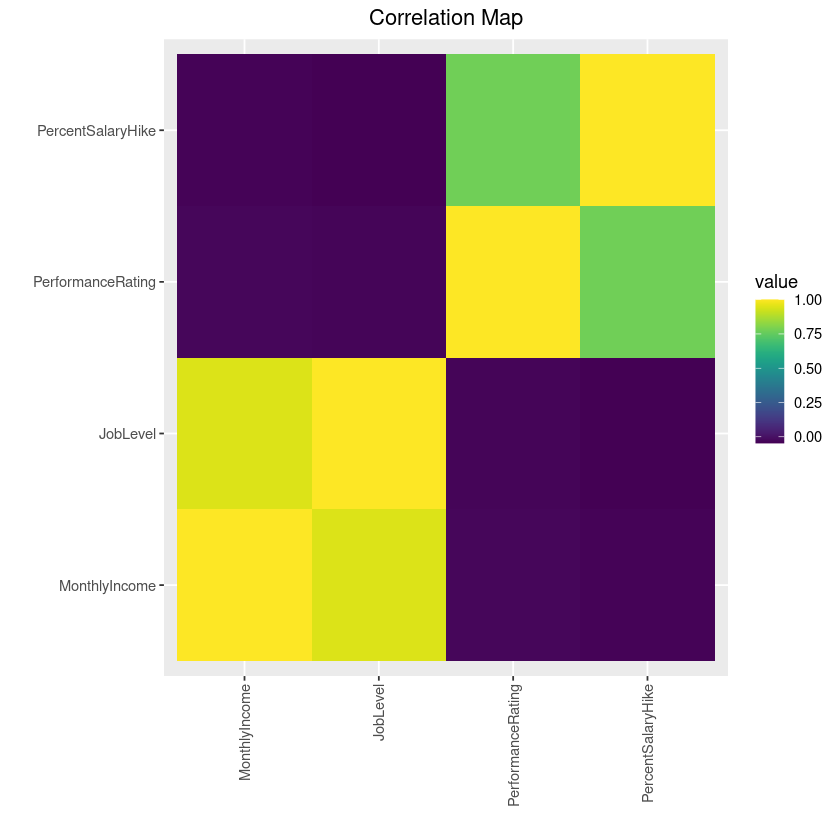

In [7]:
# Correlation
hr1 <- hr[cols]
plot_correlation(hr1, limit = 0.7)

## Feature Selection: CoxPH

There is another assumption of proportional hazard for CoxPH, which can be checked by performing statistical test on Schoenfeld residuals. The error message from `check_proportional_hazard()` suggests that `Department` and `JobRole` should be taken out from the test due to large fitted coefficients, although we will still include in the feature selection.

The result below suggests that `JobLevel`, `MonthlyIncome`, `MonthlyRate`, `NumCompaniesWorked`, `NotWorkingYears` and `TrainingTimesLastYear` violate this assumption ($p < 0.05$). We remove these from our feature when fitting our initial model.

In [8]:
focus_cols <- cols[!(cols %in% c("Department", "JobRole"))]
check_proportional_hazard(coxph_model(hr[focus_cols]))

coxph_cols <- cols[!(cols %in% c("JobLevel", "MonthlyIncome", "NumCompaniesWorked",
                                 "NotWorkingYears", "TrainingTimesLastYear", "MonthlyRate"))]

                            chisq df      p
BusinessTravel           2.92e+00  2 0.2322
DailyRate                8.16e-02  1 0.7752
DistanceFromHome         1.07e+00  1 0.3013
Education                6.77e-02  1 0.7947
EducationField           5.29e+00  5 0.3820
EnvironmentSatisfaction  3.06e-02  1 0.8611
Gender                   5.61e-04  1 0.9811
HourlyRate               1.87e-01  1 0.6651
JobInvolvement           3.69e-02  1 0.8476
JobLevel                 7.67e+00  1 0.0056
JobSatisfaction          9.46e-01  1 0.3306
MaritalStatus            4.22e+00  2 0.1212
MonthlyIncome            1.06e+01  1 0.0012
MonthlyRate              3.99e+00  1 0.0457
NumCompaniesWorked       4.78e+00  1 0.0288
OverTime                 1.90e-01  1 0.6629
PercentSalaryHike        5.65e-01  1 0.4524
PerformanceRating        7.37e-02  1 0.7860
RelationshipSatisfaction 6.22e-02  1 0.8031
StockOptionLevel         2.72e-04  1 0.9868
TrainingTimesLastYear    4.54e+00  1 0.0331
WorkLifeBalance          1.30e+0


The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          21  
 right.censored 110 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph        54  7824       4222


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5396417 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.5396417 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          27  
 right.censored 106 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=22 

      AppCindex Pairs Concordant
coxph      55.7 17024       9478


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.556734 
[1] "Total metrc"
    coxph 
0.5396417 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          39  
 right.censored 225 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=22 

      AppCindex Pairs Concordant
coxph      55.7 56372      31400


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.557017 
[1] "Total metrc"
   coxph 
1.096376 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          56  
 right.censored 338 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=22 

      AppCindex  Pairs Concordant
coxph      56.5 122185      69049


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5651224 
[1] "Total metrc"
   coxph 
1.653393 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          78  
 right.censored 449 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=22 

      AppCindex  Pairs Concordant
coxph      58.6 230010     134851


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5862842 
[1] "Total metrc"
   coxph 
2.218515 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          100 
 right.censored 558 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=22 

      AppCindex  Pairs Concordant
coxph      57.9 352633     204182


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5790202 
[1] "Total metrc"
   coxph 
2.804799 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          116 
 right.censored 673 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      59.9 509636     305422


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5992944 
[1] "Total metrc"
  coxph 
3.38382 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          141 
 right.censored 779 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 649228          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
3.983114 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          163 
 right.censored 888 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 855809          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
3.983114 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          17  
 right.censored 114 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex Pairs Concordant
coxph      56.5 13312       7515


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5645672 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.5645672 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          18  
 right.censored 115 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      56.3  6967       3921


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5627547 
[1] "Total metrc"
    coxph 
0.5645672 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          44  
 right.censored 220 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      59.6 36759      21895


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5956362 
[1] "Total metrc"
   coxph 
1.127322 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          67  
 right.censored 327 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      59.9 84987      50912


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5990564 
[1] "Total metrc"
   coxph 
1.722958 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          86  
 right.censored 441 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      53.5 155386      83106


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5348343 
[1] "Total metrc"
   coxph 
2.322015 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          112 
 right.censored 546 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      53.7 253115     135950


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5371068 
[1] "Total metrc"
   coxph 
2.856849 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          131 
 right.censored 658 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 487920          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
3.393956 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          148 
 right.censored 772 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 632876          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
3.393956 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          172 
 right.censored 879 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 825298          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
3.393956 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          24  
 right.censored 107 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=22 

      AppCindex Pairs Concordant
coxph      57.3 17570      10062


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5726796 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.5726796 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          26  
 right.censored 107 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=13 

      AppCindex Pairs Concordant
coxph      53.8 10724       5766


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5376387 
[1] "Total metrc"
    coxph 
0.5726796 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          45  
 right.censored 219 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex Pairs Concordant
coxph      59.1 52378      30941


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5907192 
[1] "Total metrc"
   coxph 
1.110318 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          70  
 right.censored 324 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      61.1 109800      67050


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6106543 
[1] "Total metrc"
   coxph 
1.701037 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          90  
 right.censored 437 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      59.8 190108     113669


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5979169 
[1] "Total metrc"
   coxph 
2.311692 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          114 
 right.censored 544 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      59.6 289702     172609


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5958134 
[1] "Total metrc"
   coxph 
2.909609 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          126 
 right.censored 663 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph        58 379275     219834


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5796169 
[1] "Total metrc"
   coxph 
3.505422 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          147 
 right.censored 773 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      59.9 600610     359518


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5985881 
[1] "Total metrc"
   coxph 
4.085039 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          168 
 right.censored 883 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      61.7 805655     497258


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6172098 
[1] "Total metrc"
   coxph 
4.683627 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          23  
 right.censored 108 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=17 

      AppCindex Pairs Concordant
coxph      43.5 12050       5243


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.435142 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
   coxph 
0.435142 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          23  
 right.censored 110 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      61.5  9851       6056


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6147962 
[1] "Total metrc"
   coxph 
0.435142 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          37  
 right.censored 227 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      59.7 30888      18451


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5973669 
[1] "Total metrc"
   coxph 
1.049938 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          53  
 right.censored 341 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      53.3 140172      74755


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5333074 
[1] "Total metrc"
   coxph 
1.647305 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          79  
 right.censored 448 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      51.1 238874     122114


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5112082 
[1] "Total metrc"
   coxph 
2.180613 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          99  
 right.censored 559 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      51.9 345019     178915


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5185645 
[1] "Total metrc"
   coxph 
2.691821 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          122 
 right.censored 667 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      52.6 494627     260172


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5259968 
[1] "Total metrc"
   coxph 
3.210385 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          143 
 right.censored 777 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      54.8 623547     341911


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5483327 
[1] "Total metrc"
   coxph 
3.736382 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          165 
 right.censored 886 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 804512          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
4.284715 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          24  
 right.censored 107 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=22 

      AppCindex Pairs Concordant
coxph      53.6 11958       6406


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5357112 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.5357112 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          14  
 right.censored 119 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      50.7  5180       2627


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5071445 
[1] "Total metrc"
    coxph 
0.5357112 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          28  
 right.censored 236 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=11 

      AppCindex Pairs Concordant
coxph      59.3 25455      15083


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5925593 
[1] "Total metrc"
   coxph 
1.042856 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          50  
 right.censored 344 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      51.7 111960      57870


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5168853 
[1] "Total metrc"
   coxph 
1.635415 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          74  
 right.censored 453 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      54.7 201966     110576


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.547498 
[1] "Total metrc"
 coxph 
2.1523 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          99  
 right.censored 559 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph      54.7 3e+05     164053


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5469498 
[1] "Total metrc"
   coxph 
2.699798 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          121 
 right.censored 668 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      55.8 395118     220333


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5576381 
[1] "Total metrc"
   coxph 
3.246748 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          139 
 right.censored 781 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      51.6 545066     281304


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5160918 
[1] "Total metrc"
   coxph 
3.804386 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          164 
 right.censored 887 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 751026          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
4.320478 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          18  
 right.censored 113 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex Pairs Concordant
coxph      50.6  9379       4741


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5055147 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.5055147 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          22  
 right.censored 111 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      69.4 12908       8955


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6937666 
[1] "Total metrc"
    coxph 
0.5055147 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          41  
 right.censored 223 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      68.7 53142      36498


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6867895 
[1] "Total metrc"
   coxph 
1.199281 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          59  
 right.censored 335 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      66.4 116422      77339


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6643011 
[1] "Total metrc"
   coxph 
1.886071 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          81  
 right.censored 446 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      48.2 193438      93331


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4824853 
[1] "Total metrc"
   coxph 
2.550372 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          110 
 right.censored 548 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      54.1 340078     183884


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
  coxph 
0.54071 
[1] "Total metrc"
   coxph 
3.032857 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          129 
 right.censored 660 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      63.8 479176     305846


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.638276 
[1] "Total metrc"
   coxph 
3.573567 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1,2,3,4,5 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          152 
 right.censored 768 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      62.5 628530     392543


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6245409 
[1] "Total metrc"
   coxph 
4.211843 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  1,2,3,4,5 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          169 
 right.censored 882 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 772530          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
4.836384 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          19  
 right.censored 112 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      58.2  8478       4937


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5823618 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.5823618 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          20  
 right.censored 113 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph      62.5  9058       5662


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.625084 
[1] "Total metrc"
    coxph 
0.5823618 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          38  
 right.censored 226 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      66.3 48255      31974


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6626079 
[1] "Total metrc"
   coxph 
1.207446 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          61  
 right.censored 333 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      64.7 124077      80217


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6465105 
[1] "Total metrc"
   coxph 
1.870054 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          86  
 right.censored 441 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      64.5 215445     139012


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6452341 
[1] "Total metrc"
   coxph 
2.516564 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          103 
 right.censored 555 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      60.9 313947     191134


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6088112 
[1] "Total metrc"
   coxph 
3.161798 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          126 
 right.censored 663 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      59.6 481562     287015


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5960079 
[1] "Total metrc"
   coxph 
3.770609 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          148 
 right.censored 772 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      59.6 638783     380961


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5963853 
[1] "Total metrc"
   coxph 
4.366617 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          170 
 right.censored 881 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      59.5 837931     498762


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5952302 
[1] "Total metrc"
   coxph 
4.963003 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          19  
 right.censored 112 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      43.4 10008       4342


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.433904 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
   coxph 
0.433904 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          23  
 right.censored 110 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      52.2  8771       4578


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
  coxph 
0.52196 
[1] "Total metrc"
   coxph 
0.433904 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          47  
 right.censored 217 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=16 

      AppCindex Pairs Concordant
coxph      60.3 40028      24149


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6033006 
[1] "Total metrc"
    coxph 
0.9558641 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          61  
 right.censored 333 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      46.4 120432      55936


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4644611 
[1] "Total metrc"
   coxph 
1.559165 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          87  
 right.censored 440 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      49.5 208672     103327


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4951664 
[1] "Total metrc"
   coxph 
2.023626 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          106 
 right.censored 552 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      48.8 289141     140982


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4875886 
[1] "Total metrc"
   coxph 
2.518792 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          125 
 right.censored 664 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      49.4 405419      2e+05


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4943577 
[1] "Total metrc"
   coxph 
3.006381 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          151 
 right.censored 769 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      49.2 574346     282311


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4915352 
[1] "Total metrc"
   coxph 
3.500738 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          174 
 right.censored 877 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 808890          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
3.992274 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          22  
 right.censored 109 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      53.9  8203       4423


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5392641 
[1] "Total metrc"
[1] 0

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          1   
 right.censored 1   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=9 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.5392641 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          25  
 right.censored 108 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      46.8  9954       4663


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4684567 
[1] "Total metrc"
    coxph 
0.5392641 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          39  
 right.censored 225 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      35.2 31858      11203


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.3516492 
[1] "Total metrc"
   coxph 
1.007721 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          59  
 right.censored 335 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      44.5 87042      38704


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4446599 
[1] "Total metrc"
  coxph 
1.35937 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          79  
 right.censored 448 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph        45 154318      69482


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4502545 
[1] "Total metrc"
  coxph 
1.80403 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          102 
 right.censored 556 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 269338          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
2.254285 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          127 
 right.censored 662 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 434583          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
2.254285 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          145 
 right.censored 775 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 583560          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
2.254285 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          169 
 right.censored 882 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 856024          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
2.254285 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          22  
 right.censored 109 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=20 

      AppCindex Pairs Concordant
coxph      54.8 11223       6145


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5475497 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.5475497 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          18  
 right.censored 115 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=13 

      AppCindex Pairs Concordant
coxph      65.1  8933       5818


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6513286 
[1] "Total metrc"
    coxph 
0.5475497 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          37  
 right.censored 227 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=16 

      AppCindex Pairs Concordant
coxph      65.3 33449      21852


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6532863 
[1] "Total metrc"
   coxph 
1.198878 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          61  
 right.censored 333 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=16 

      AppCindex Pairs Concordant
coxph      64.7 79328      51327


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6470146 
[1] "Total metrc"
   coxph 
1.852165 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          82  
 right.censored 445 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=22 

      AppCindex  Pairs Concordant
coxph      50.3 208492     104924


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5032499 
[1] "Total metrc"
   coxph 
2.499179 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          99  
 right.censored 559 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      56.4 349322     196899


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5636607 
[1] "Total metrc"
   coxph 
3.002429 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          122 
 right.censored 667 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      56.5 495501     280017


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.565119 
[1] "Total metrc"
  coxph 
3.56609 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          149 
 right.censored 771 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      59.8 722864     432006


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5976304 
[1] "Total metrc"
   coxph 
4.131209 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          170 
 right.censored 881 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 879329          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
4.728839 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          16  
 right.censored 115 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph      50.5 16049       8108


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5052327 
[1] "Total metrc"
[1] 0

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          1   
 right.censored 1   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.5052327 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          22  
 right.censored 111 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph      84.6 17737      14998


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.8455422 
[1] "Total metrc"
    coxph 
0.5052327 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          43  
 right.censored 221 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph        70 52006      36384


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6996078 
[1] "Total metrc"
   coxph 
1.350775 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          62  
 right.censored 332 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=14 

      AppCindex Pairs Concordant
coxph      68.5 78878      54059


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6853463 
[1] "Total metrc"
   coxph 
2.050383 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          79  
 right.censored 448 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      66.8 183706     122757


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6682231 
[1] "Total metrc"
   coxph 
2.735729 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          104 
 right.censored 554 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      68.3 280589     191739


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6833446 
[1] "Total metrc"
   coxph 
3.403952 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          128 
 right.censored 661 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      67.8 397774     269851


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6784047 
[1] "Total metrc"
   coxph 
4.087297 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          151 
 right.censored 769 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      67.4 587884     396049


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.673686 
[1] "Total metrc"
   coxph 
4.765701 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  3 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          174 
 right.censored 877 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      67.2 800575     538278


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6723639 
[1] "Total metrc"
   coxph 
5.439387 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          22  
 right.censored 109 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=20 

      AppCindex Pairs Concordant
coxph      79.8 22367      17843


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7977458 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.7977458 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          16  
 right.censored 117 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      65.8  9128       6008


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6581142 
[1] "Total metrc"
    coxph 
0.7977458 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          37  
 right.censored 227 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      62.4 37828      23594


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.623737 
[1] "Total metrc"
  coxph 
1.45586 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          62  
 right.censored 332 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph        54 100740      54450


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5404963 
[1] "Total metrc"
   coxph 
2.079597 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          94  
 right.censored 433 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      52.7 196804     103761


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5272266 
[1] "Total metrc"
   coxph 
2.620093 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          111 
 right.censored 547 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      55.7 306138     170494


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5569191 
[1] "Total metrc"
  coxph 
3.14732 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          129 
 right.censored 660 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 446861          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
3.704239 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          149 
 right.censored 771 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph         0 6e+05          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
3.704239 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          170 
 right.censored 881 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 830316          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
3.704239 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          20  
 right.censored 111 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph        48 11211       5383


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4801876 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.4801876 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          13  
 right.censored 120 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=15 

      AppCindex Pairs Concordant
coxph      68.5  7628       5227


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6852403 
[1] "Total metrc"
    coxph 
0.4801876 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          38  
 right.censored 226 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=15 

      AppCindex Pairs Concordant
coxph      66.9 42472      28414


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6690062 
[1] "Total metrc"
   coxph 
1.165428 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          58  
 right.censored 336 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=17 

      AppCindex Pairs Concordant
coxph      62.8 89702      56353


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6282266 
[1] "Total metrc"
   coxph 
1.834434 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          73  
 right.censored 454 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=17 

      AppCindex  Pairs Concordant
coxph      60.3 147916      89220


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6031777 
[1] "Total metrc"
   coxph 
2.462661 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          95  
 right.censored 563 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=21 

      AppCindex  Pairs Concordant
coxph      65.6 259207     169999


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6558426 
[1] "Total metrc"
   coxph 
3.065838 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          116 
 right.censored 673 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      65.4 406557     265996


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6542664 
[1] "Total metrc"
   coxph 
3.721681 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          141 
 right.censored 779 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      65.6 594322     389856


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6559673 
[1] "Total metrc"
   coxph 
4.375947 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          165 
 right.censored 886 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      56.5 782424     441934


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5648269 
[1] "Total metrc"
   coxph 
5.031915 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          18  
 right.censored 113 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      61.5  7326       4508


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6152325 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.6152325 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          14  
 right.censored 119 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph        80 14648      11722


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.800283 
[1] "Total metrc"
    coxph 
0.6152325 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          37  
 right.censored 227 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph      80.5 60957      49066


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.8049334 
[1] "Total metrc"
   coxph 
1.415515 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          68  
 right.censored 326 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      65.3 141972      92658


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6526496 
[1] "Total metrc"
   coxph 
2.220449 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          91  
 right.censored 436 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph        65 252985     164455


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6500594 
[1] "Total metrc"
   coxph 
2.873098 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          110 
 right.censored 548 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      62.2 369987     230213


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6222199 
[1] "Total metrc"
   coxph 
3.523158 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          129 
 right.censored 660 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      63.3 522561     330841


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6331153 
[1] "Total metrc"
   coxph 
4.145378 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          152 
 right.censored 768 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph        64 707674     452745


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6397652 
[1] "Total metrc"
   coxph 
4.778493 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          169 
 right.censored 882 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      64.4 874147     562954


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.644004 
[1] "Total metrc"
   coxph 
5.418258 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          17  
 right.censored 114 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      40.8  6658       2717


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4080833 
[1] "Total metrc"
[1] 0

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          1   
 right.censored 1   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=1 

      AppCindex Pairs Concordant
coxph       100     2          2


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    1 
[1] "Total metrc"
    coxph 
0.4080833 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          26  
 right.censored 107 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=21 

      AppCindex Pairs Concordant
coxph        38 12896       4905


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.3803764 
[1] "Total metrc"
   coxph 
1.408083 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          45  
 right.censored 219 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph        45 50895      22893


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4498031 
[1] "Total metrc"
  coxph 
1.78846 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          67  
 right.censored 327 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      43.5 126647      55098


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4350543 
[1] "Total metrc"
   coxph 
2.238263 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          93  
 right.censored 434 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      40.9 257756     105356


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4087437 
[1] "Total metrc"
   coxph 
2.673317 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          113 
 right.censored 545 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      41.1 381916     157091


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4113224 
[1] "Total metrc"
   coxph 
3.082061 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          135 
 right.censored 654 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      46.7 561051     261905


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4668109 
[1] "Total metrc"
   coxph 
3.493383 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          158 
 right.censored 762 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      49.9 722734     360815


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4992355 
[1] "Total metrc"
   coxph 
3.960194 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          178 
 right.censored 873 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph        50 905504     453192


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5004862 
[1] "Total metrc"
   coxph 
4.459429 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          21  
 right.censored 110 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=11 

      AppCindex Pairs Concordant
coxph      47.5  9561       4540


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4748964 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.4748964 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          14  
 right.censored 119 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=14 

      AppCindex Pairs Concordant
coxph      41.2  8458       3482


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4116656 
[1] "Total metrc"
    coxph 
0.4748964 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          42  
 right.censored 222 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      48.1 47108      22668


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4811872 
[1] "Total metrc"
   coxph 
0.886562 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          60  
 right.censored 334 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      50.8 112941      57331


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5076145 
[1] "Total metrc"
   coxph 
1.367749 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          86  
 right.censored 441 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph        50 216313     108237


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5003718 
[1] "Total metrc"
   coxph 
1.875364 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          107 
 right.censored 551 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 352663          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
2.375735 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          131 
 right.censored 658 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 495478          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
2.375735 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          151 
 right.censored 769 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 639230          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
2.375735 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          174 
 right.censored 877 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 853333          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
2.375735 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          19  
 right.censored 112 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=11 

      AppCindex Pairs Concordant
coxph      64.8  8874       5755


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6484868 
[1] "Total metrc"
[1] 0

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          1   
 right.censored 1   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=1 

      AppCindex Pairs Concordant
coxph       100     2          2


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    1 
[1] "Total metrc"
    coxph 
0.6484868 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          26  
 right.censored 107 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      57.9 10090       5842


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5789971 
[1] "Total metrc"
   coxph 
1.648487 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          44  
 right.censored 220 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=13 

      AppCindex Pairs Concordant
coxph      57.2 37907      21689


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5721643 
[1] "Total metrc"
   coxph 
2.227484 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          66  
 right.censored 328 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=19 

      AppCindex Pairs Concordant
coxph      54.3 96097      52174


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5429335 
[1] "Total metrc"
   coxph 
2.799648 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          91  
 right.censored 436 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      53.3 219271     116797


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5326612 
[1] "Total metrc"
   coxph 
3.342582 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          108 
 right.censored 550 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      53.8 323263     173821


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5377076 
[1] "Total metrc"
   coxph 
3.875243 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          127 
 right.censored 662 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 448603          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
  coxph 
4.41295 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          146 
 right.censored 774 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 622945          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
  coxph 
4.41295 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          165 
 right.censored 886 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 781433          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
  coxph 
4.41295 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          19  
 right.censored 112 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=13 

      AppCindex Pairs Concordant
coxph      64.7  9871       6388


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6471612 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.6471612 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          29  
 right.censored 104 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=16 

      AppCindex Pairs Concordant
coxph      57.1 12637       7215


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5709176 
[1] "Total metrc"
    coxph 
0.6471612 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          43  
 right.censored 221 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=20 

      AppCindex Pairs Concordant
coxph      58.4 43060      25151


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.584081 
[1] "Total metrc"
   coxph 
1.218079 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          63  
 right.censored 331 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=20 

      AppCindex Pairs Concordant
coxph      61.9 95330      59020


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6191148 
[1] "Total metrc"
  coxph 
1.80216 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          91  
 right.censored 436 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=20 

      AppCindex  Pairs Concordant
coxph      59.8 179478     107397


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5983895 
[1] "Total metrc"
   coxph 
2.421275 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          112 
 right.censored 546 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=21 

      AppCindex  Pairs Concordant
coxph      60.9 308002     187640


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6092188 
[1] "Total metrc"
   coxph 
3.019664 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          134 
 right.censored 655 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=21 

      AppCindex  Pairs Concordant
coxph        62 421377     261304


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6201193 
[1] "Total metrc"
   coxph 
3.628883 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          155 
 right.censored 765 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 551475          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
4.249002 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          177 
 right.censored 874 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 766214          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
4.249002 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          21  
 right.censored 110 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=10 

      AppCindex Pairs Concordant
coxph      56.7  9094       5158


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5671922 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.5671922 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          22  
 right.censored 111 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex Pairs Concordant
coxph      71.7 12862       9224


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7171535 
[1] "Total metrc"
    coxph 
0.5671922 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          36  
 right.censored 228 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex Pairs Concordant
coxph      66.8 46363      30983


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6682822 
[1] "Total metrc"
   coxph 
1.284346 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          59  
 right.censored 335 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      65.1 120011      78182


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6514512 
[1] "Total metrc"
   coxph 
1.952628 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          88  
 right.censored 439 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      62.7 196006     122802


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6265201 
[1] "Total metrc"
   coxph 
2.604079 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          105 
 right.censored 553 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      60.6 281824     170876


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6063205 
[1] "Total metrc"
   coxph 
3.230599 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          128 
 right.censored 661 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      58.4 406144     237256


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5841674 
[1] "Total metrc"
  coxph 
3.83692 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          150 
 right.censored 770 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      56.8 625130     355347


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5684372 
[1] "Total metrc"
   coxph 
4.421087 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          165 
 right.censored 886 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 773756          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
4.989524 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          26  
 right.censored 105 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      62.2 14583       9067


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6217792 
[1] "Total metrc"
[1] 0

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Uncensored response of a survival model

No.Observations: 2 

Pattern:
       Freq
 event 2   

no censoring
No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=2 

      AppCindex Pairs Concordant
coxph       100     2          2


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    1 
[1] "Total metrc"
    coxph 
0.6217792 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          15  
 right.censored 118 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=13 

      AppCindex Pairs Concordant
coxph      49.6  7457       3699


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4960255 
[1] "Total metrc"
   coxph 
1.621779 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          28  
 right.censored 236 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex Pairs Concordant
coxph      48.7 50981      24850


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4874412 
[1] "Total metrc"
   coxph 
2.117805 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          48  
 right.censored 346 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      51.3 119622      61349


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5128519 
[1] "Total metrc"
   coxph 
2.605246 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          68  
 right.censored 459 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph        50 219702     109858


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5000338 
[1] "Total metrc"
   coxph 
3.118098 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          92  
 right.censored 566 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      47.5 318939     151590


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4752945 
[1] "Total metrc"
   coxph 
3.618132 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          112 
 right.censored 677 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      50.4 470499     236998


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5037167 
[1] "Total metrc"
   coxph 
4.093426 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          134 
 right.censored 786 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph      47.4 616663     292076


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.4736396 
[1] "Total metrc"
   coxph 
4.597143 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          157 
 right.censored 894 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=23 

      AppCindex  Pairs Concordant
coxph        52 794945     413551


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5202261 
[1] "Total metrc"
   coxph 
5.070782 
[1] "Average univariate Cox score:"
                 JobRole                 OverTime            MaritalStatus 
               0.6111751                0.6062262                0.5596741 
   YearsAtOtherCompanies  EnvironmentSatisfaction               Department 
               0.5591008                0.5558233                0.5300837 
         WorkLifeBalance        PercentSalaryHike           EducationField 
               0.4989524                0.4959916                0.4836384 
          JobInvolvement RelationshipSatisfaction                Education 
               0.4728839                0.4412950                0.4320478 
        DistanceFromHome         StockOptionLevel                   Gender 
               0.4284715                0.4249002                0.3992274 
          BusinessTravel          JobSatisfaction                DailyRate 
               0.3983114                0.3704239     

Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,5,17 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          25  
 right.censored 106 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=16 

      AppCindex Pairs Concordant
coxph      79.3 14354      11388


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7933701 
[1] "Total metrc"
[1] 0


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,5,17 ; coefficient may be infinite. ”
Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.7933701 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,17,23,24 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          16  
 right.censored 117 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph      21.7 20189       4381


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.2170222 
[1] "Total metrc"
    coxph 
0.7933701 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,17,23,24 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          42  
 right.censored 222 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph      60.9 53147      32387


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.609385 
[1] "Total metrc"
   coxph 
1.010392 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,17,23,24 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          60  
 right.censored 334 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      70.9 110668      78413


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7085429 
[1] "Total metrc"
   coxph 
1.619777 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,17,23,24 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          89  
 right.censored 438 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 193936          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
  coxph 
2.32832 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,17,23,24 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          106 
 right.censored 552 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 285951          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
  coxph 
2.32832 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,17,21,23,24 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          125 
 right.censored 664 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 438330          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
  coxph 
2.32832 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,17,21,23,24 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          151 
 right.censored 769 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 639652          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
  coxph 
2.32832 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,17,20,21,23,24 ; coefficient may be infinite. ”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          168 
 right.censored 883 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 864804          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
  coxph 
2.32832 
   coxph 
0.232832 


Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,5,17 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,5,17 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,5,17 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,5,17 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,17,23,24 ; coefficient may be infinite. ”
Warning message in coxph.fit(X, Y, istrat, offset, init, control, weights = weights, :
“Loglik converged before variable  4,5,17 ; coefficient may be infinite. ”
Warning message in coxph

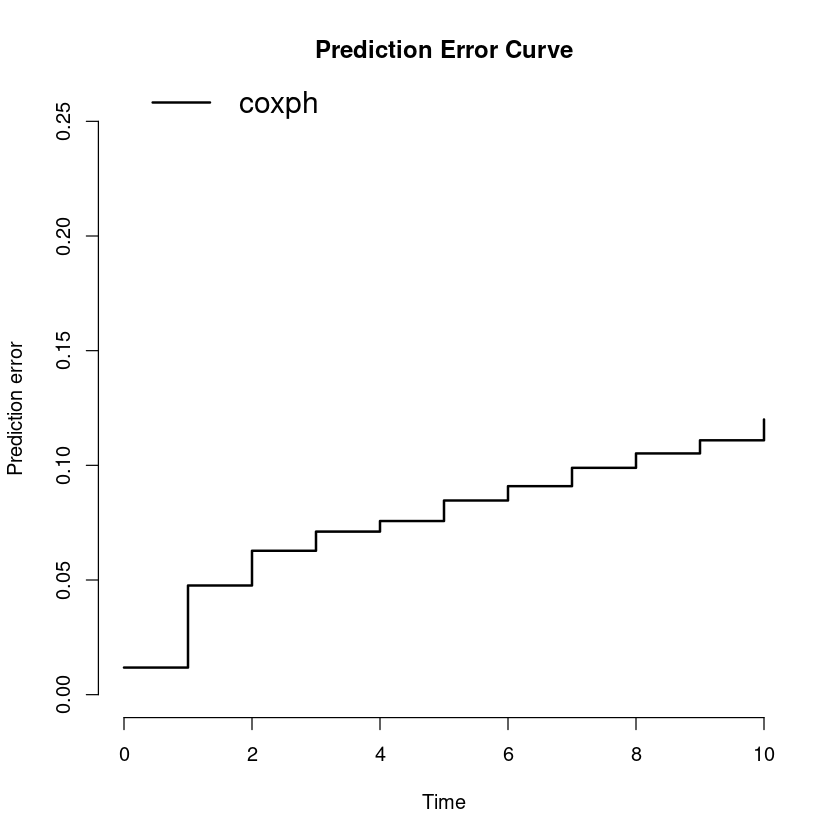

In [9]:
# First iteration
options(warn = 0) # Suppress warnings due to big coxph coefficients

hr1c <- hr[coxph_cols]
print_coxph_var_rank(hr1c)
print_c_index(hr1c, coxph_model)
plot_pec(hr1c, coxph_model)

options(warn = 0) # Reactivate warnings

We can see that `StockOptionLevel` and `JobInvolvement` has much higher univariate concordance index compared to others. By taking heuristics that a difference of less than 1% as *not powerful enough*, and considering the benchmark c-index of 0.5 (achieved by a random assigner model), the scores of other covariates seem not prominent enough for feature selection.

The concordance index of the initial model with all (feasible) columns selected is around $75\%$, while the PEC graph shows that our model has averagely around $90\%$ accuracy ($10\%$ error) in predicting employee attrition within the span of 10 years.


The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          19  
 right.censored 112 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=9 

      AppCindex Pairs Concordant
coxph      53.5  6413       3431


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5350661 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.5350661 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          22  
 right.censored 111 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      77.6  9962       7730


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7759207 
[1] "Total metrc"
    coxph 
0.5350661 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          51  
 right.censored 213 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      75.3 41077      30918


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7526866 
[1] "Total metrc"
   coxph 
1.310987 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          77  
 right.censored 317 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      70.3 95896      67430


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7031596 
[1] "Total metrc"
   coxph 
2.063673 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          99  
 right.censored 428 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph        72 212826     153152


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7196093 
[1] "Total metrc"
   coxph 
2.766833 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          119 
 right.censored 539 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      70.9 309032     218966


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7085548 
[1] "Total metrc"
   coxph 
3.486442 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          135 
 right.censored 654 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      69.6 428330     297925


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.695551 
[1] "Total metrc"
   coxph 
4.194997 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          154 
 right.censored 766 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 620605          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
4.890548 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          174 
 right.censored 877 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 821652          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
4.890548 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          13  
 right.censored 118 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex Pairs Concordant
coxph      44.8  8497       3807


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.447979 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
   coxph 
0.447979 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          21  
 right.censored 112 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=13 

      AppCindex Pairs Concordant
coxph      60.2  9483       5712


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6023566 
[1] "Total metrc"
   coxph 
0.447979 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          42  
 right.censored 222 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=13 

      AppCindex Pairs Concordant
coxph      58.1 38395      22293


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5806345 
[1] "Total metrc"
   coxph 
1.050336 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          68  
 right.censored 326 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      59.3 123698      73397


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5933611 
[1] "Total metrc"
  coxph 
1.63097 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          87  
 right.censored 440 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      60.7 221466     134403


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6068783 
[1] "Total metrc"
   coxph 
2.224331 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          104 
 right.censored 554 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      59.7 331066     197706


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.5971804 
[1] "Total metrc"
  coxph 
2.83121 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          131 
 right.censored 658 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      61.2 474700     290308


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6115614 
[1] "Total metrc"
  coxph 
3.42839 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          158 
 right.censored 762 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      62.2 663749     413119


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6224019 
[1] "Total metrc"
   coxph 
4.039951 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          178 
 right.censored 873 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      62.7 845785     530625


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.627376 
[1] "Total metrc"
   coxph 
4.662353 
[1] "Average univariate Cox score:"
  JobInvolvement StockOptionLevel 
       0.5289729        0.4890548 
[1] "Average concordance index:"

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          24  
 right.censored 107 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=16 

      AppCindex Pairs Concordant
coxph      68.7 11175       7675


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6868343 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”



The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 2 

Pattern:
                Freq
 event          0   
 right.censored 2   

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=-Inf 

      AppCindex Pairs Concordant
coxph       NaN     0          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
[1] 0
[1] "Total metrc"
    coxph 
0.6868343 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 133 

Pattern:
                Freq
 event          23  
 right.censored 110 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph      81.6 19896      16239


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.8161752 
[1] "Total metrc"
    coxph 
0.6868343 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 264 

Pattern:
                Freq
 event          44  
 right.censored 220 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex Pairs Concordant
coxph      77.2 60900      46995


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
   coxph 
0.771672 
[1] "Total metrc"
  coxph 
1.50301 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 394 

Pattern:
                Freq
 event          63  
 right.censored 331 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      75.1 124356      93420


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7512255 
[1] "Total metrc"
   coxph 
2.274681 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 527 

Pattern:
                Freq
 event          79  
 right.censored 448 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      73.2 214772     157276


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7322913 
[1] "Total metrc"
   coxph 
3.025907 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 658 

Pattern:
                Freq
 event          96  
 right.censored 562 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=24 

      AppCindex  Pairs Concordant
coxph      72.5 314593     227936


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.7245448 
[1] "Total metrc"
   coxph 
3.758198 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 789 

Pattern:
                Freq
 event          117 
 right.censored 672 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      66.5 421350     280019


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6645764 
[1] "Total metrc"
   coxph 
4.482743 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 920 

Pattern:
                Freq
 event          138 
 right.censored 782 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph      62.8 613173     385195


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    coxph 
0.6281999 
[1] "Total metrc"
   coxph 
5.147319 

The c-index for right censored event times

Prediction models:

coxph 
coxph 

Right-censored response of a survival model

No.Observations: 1051 

Pattern:
                Freq
 event          162 
 right.censored 889 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=31 

      AppCindex  Pairs Concordant
coxph         0 817818          0


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
coxph 
    0 
[1] "Total metrc"
   coxph 
5.775519 
    coxph 
0.5775519 


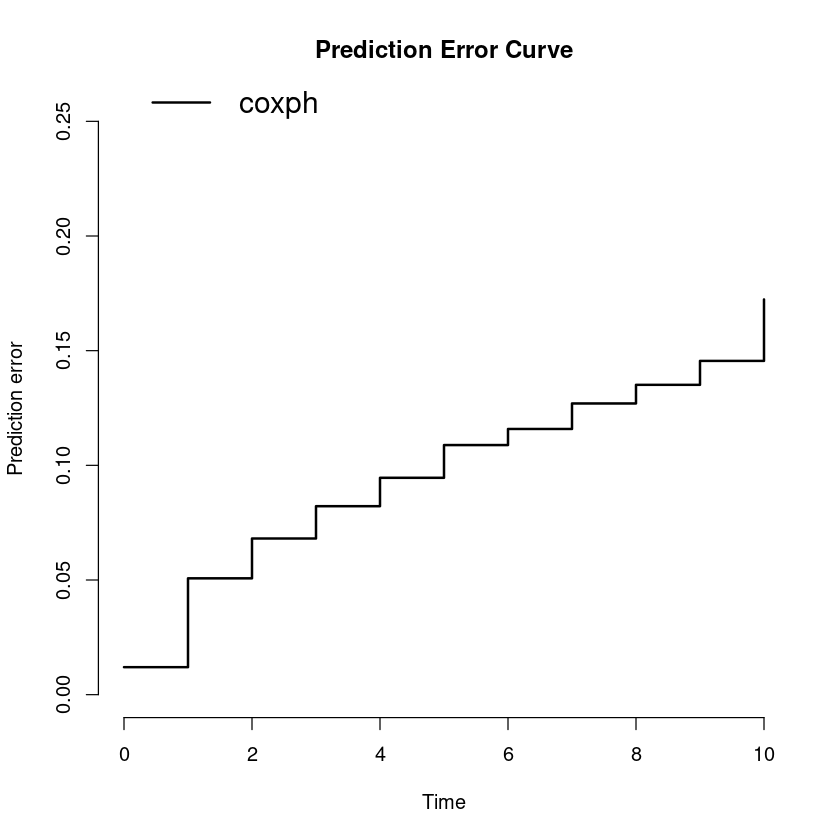

In [10]:
coxph_cols <- c("Attrition", "YearsAtCompany", "StockOptionLevel", "JobInvolvement")
hr1c <- hr[coxph_cols]
print_coxph_var_rank(hr1c)
print_c_index(hr1c, coxph_model)
plot_pec(hr1c, coxph_model) #warning

## Feature Selection: RSF

We develop Random Survival Forest model for our data now. The number of trees used in RSF is on the lower scale (100) for faster process. Note that there is no proportional hazarda assumption here, so the initial feature set can be incorporated here.

In [11]:
# First iteration
print_rsf_var_rank(hr1)
print_c_index(hr1, rsf_model)
plot_pec(hr1, rsf_model)

[1] "Average variable importance:"
[1] "Metrics"
          BusinessTravel                DailyRate               Department 
            0.0275285171            -0.0077566540            -0.0346768061 
        DistanceFromHome                Education           EducationField 
            0.0202281369            -0.0007604563            -0.0125475285 
 EnvironmentSatisfaction                   Gender               HourlyRate 
           -0.0020152091            -0.0021292776            -0.0186311787 
          JobInvolvement                 JobLevel                  JobRole 
           -0.0012167300             0.2087452471            -0.0254752852 
         JobSatisfaction            MaritalStatus            MonthlyIncome 
           -0.0008365019            -0.0152091255             0.1106463878 
             MonthlyRate       NumCompaniesWorked                 OverTime 
           -0.0010646388             0.0130798479             0.1455893536 
       PercentSalaryHike        Perform

[1] "Average concordance index:"

The c-index for right censored event times

Prediction models:

rfsrc 
rfsrc 

Right-censored response of a survival model

No.Observations: 131 

Pattern:
                Freq
 event          23  
 right.censored 108 

Censoring model for IPCW: marginal model (Kaplan-Meier for censoring distribution) 

No data splitting: either apparent or independent test sample performance

Estimated C-index in % at time=20 

      AppCindex Pairs Concordant
rfsrc        77 14785      11379


Warning message in summary.Cindex(x, print = TRUE, ...):
“The C-index is not proper for t-year predictions. Blanche et al. (2018), Biostatistics, 20(2): 347--357.

Consider using time-dependent AUC instead: riskRegression::Score”


[1] "Metrics"
    rfsrc 
0.7696462 
[1] "Total metrc"
[1] 0


Warning message in max(Y[status == 1]):
“no non-missing arguments to max; returning -Inf”


ERROR: Error in prodlim::sindex(jump.times = object$time.interest, eval.times = times): NA/NaN/Inf in foreign function call (arg 3)


The prominent group of importance variables in RSF are `JobLevel`, `OverTime` and `MonthlyIncome`. The common theme among these features is a connection to workplace welfare. We note previoiusly that `JobLevel` and `MonthlyIncome` are highly correlated. We pick `JobLevel` for our consideration, just because it has a higher shown importance level.

Other career-related features such as `StockOptionLevel`, `JobRole`, `EnvironmentSatisfaction` and `NumCompaniesWorked` and `NotWorkingYears`, also appear important. The variable `NumCompaniesWorked` can confuse the effect of job-hopping and one of longer work experience. However, since it does not seem to correlate much with `TotalWorkingYears` (not shown), we can somewhat assume that it is an indicator of job-hopping.

The concordance index is better in this case at around $75-80\%$, with PEC error under $7.5\%$ across ten years.

In [ ]:
rsf_cols <- c("Attrition", "YearsAtCompany", "JobLevel", "OverTime", "StockOptionLevel", "JobRole",
              "EnvironmentSatisfaction",  "NumCompaniesWorked", "NotWorkingYears")

hr1r <- hr[rsf_cols]
print_rsf_var_rank(hr1r)
print_c_index(hr1r, rsf_model)
plot_pec(hr1r, rsf_model)

### Segmenting Attrition Rate

Now, we examine aggregated historical attrition rates for the categorical features `JobRole`:

In [ ]:
suppressMessages(library(dplyr))

aggregated_attrition <- function (df, col) {
  options(warn = -1) # Suppress warnings
    
  # Best for categorical (unless numerical int range is small)
  result <- df[, c("Attrition", col)] %>%
  group_by_(col) %>%
  summarize(
    AttritionCount = sum(Attrition),
    TotalEmployees = n(),
    AttritionRate = AttritionCount/TotalEmployees
  )
    
  options(warn = 0) # Reactivate warnings
  return(result)
}

aggregated_attrition(hr, "JobRole")

Among job positions, managerial positions and Healthcare Representation have around $5\%$ attrition rate, while general positions sit at about $15-25\%$. [A simple online search](https://www.statista.com/statistics/934377/professional-services-worldwide-employee-attrition-by-region/) shows an average of $10-18\%$ global churn rate in 2022, so this company's number is comparatively a pretty high one. Sales reps roles are particularly prone to attrition (a whopping $40\%$) while also having a small number of employees. This is therefore an employee group that we need to focus on for mitigating their leaving.

## Completing Final Models

Our final model is formed by two methods of CoxPH and RSF, each with their own features.

In [ ]:
rsf_final_model <- rsf_model(hr[rsf_cols])
coxph_final_model <- coxph_model(hr[coxph_cols])
rsf_cols
coxph_cols

---

## Predicting Employee Attrition Risk

We produce the estimated cumulative hazard function $H(i, t)$ of attrition for each of our employee $i$ for Random Survival Forest model, and hazard ratio relative to the exponent of mean for Cox Proportional Hazard model.

In [ ]:
# Appending prediction
hr <- hr_full_row
hr["HazardRatio_CoxPH"] <- predict(coxph_final_model, hr, type = "risk")
# coxph_risk <- exp(predict(coxph_final_model, hr, type = "lp")) %*% t(basehaz(coxph_final_model)["hazard"])

years = 5
rsf_risk <- predict(rsf_final_model, hr)$chf[, 1:(years+1)] # matrix
rsf_survival_probs <- predict(rsf_final_model, hr)$survival[, 1:(years+1)]
hr["Hazard_RSF_Current"] <- rsf_risk[, 1]
hzrsf_cols <- sapply(0:years, function(i) {paste0("Hazard_RSF_", i)})
hr[hzrsf_cols] <- rsf_risk[, 1 + (0:years)]

preview_cols <- c("EmployeeNumber", coxph_cols, rsf_cols, "HazardRatio_CoxPH", hzrsf_cols)

# Table sorted by Cox Hazard Ratio
cutoff = 50
sorted <- function (df, key_col) {
  df <- df[df["Attrition"] == FALSE, ]
  return(row.names(df)[order(df[, key_col], decreasing = TRUE)][1:cutoff])
}
hr_sorted_coxph <- hr[sorted(hr, "HazardRatio_CoxPH"), ]
head(hr_sorted_coxph[, preview_cols])

### Visualisation with `plotly`

We also use `plotly` to draw an interactive visualisation of  top $50$ employee rank list, where user can explore trends of attrition risks based on various factors. **Unfortunately, it did not render on `nbviewer` but users can download the notebook or R-scropt. A static `.png` preview image is also provided.**

By examining the overlapping of top $50$ employees based on RSF and CoxPH, it seems that employee number $2021$, $1586$, $875$, $957$, $1980$, $120$, $1286$, $1961$ are particularly prone to quitting.

In [ ]:
# Plotly implementation
suppressMessages(library(plotly))

group <- "EmployeeNumber"
hr_sorted_rsf <- hr[sorted(hr, "Hazard_RSF_Current"), ]

# Adding RSH trajectory risks
fig <- plot_ly()
for (rank in 1:cutoff) {
  employee_row_num <- as.numeric(rownames(hr_sorted_rsf)[rank])
  employee_row <- hr_sorted_rsf[rank, ]
  x <- 0:(ncol(rsf_risk)-1)
  y <- rsf_risk[employee_row_num, ]
  fig <- fig %>% add_trace(x = x,
                           y = y,
                           name = employee_row["EmployeeNumber"],
                           type = "scatter", mode = "lines+markers", # every time you put type, it assign DOMNum = 0
                           marker = list(size = 4),
                           line = list(shape = "spline", width = 1),
                           hovertemplate = paste0("<i>#", rank, ": Employee ", employee_row["EmployeeNumber"], "</i>",
                                         "\nYear: ", x,
                                         "\nRisk score: ", y),
                           legendgroup = employee_row["EmployeeNumber"],
                           showlegend = TRUE
  )
}

# CoxPH
fig <- fig %>% add_trace(data = hr_sorted_coxph,
                         y = ~HazardRatio_CoxPH,
                         type = "bar",
                         marker = list(color = ~YearsAtCompany),
                         hovertemplate = paste0("Employee ", hr_sorted_coxph$EmployeeNumber,
                                         "\nHazard ratio: ", hr_sorted_coxph$HazardRatio_CoxPH),
                         visible = FALSE, showlegend = FALSE)


# --- Decorators
# Including the baseline
avg_cum_hazard <- -log(1-mean(hr[, "Attrition"]))
baseline <- list(
  type = "line", x0 = 0, x1 = 5, y0 = avg_cum_hazard, y1 = avg_cum_hazard,
  line = list(dash = "dash", width = 4, color = "#82A0D8")
)
fig <- fig %>% layout(
  shapes = list(baseline)
) %>% add_text(
  showlegend = FALSE, x = 0.3, y = 0.22, text = "Average hazard",
  textfont = list(family = "sans serif", size = 10) 
)

# Helper function to group RSF metrics based on variables
library(RColorBrewer)
unique_index <- function(x) {
  unique_vals <- unique(x)
  first_occur <- integer(length(unique_vals))
  for (i in 1:length(unique_vals)) {
    first_occur[i] <- which(x == unique_vals[i])[1]
  }
  return(first_occur)
}
create_buttons <- function(vars) {
  lapply(vars, function(var) {
    color_palletes <- brewer.pal(12, "Set3")
    var_factors <- as.numeric(factor(hr_sorted_rsf[[var]]))
    button <- list(
      method = "restyle",
      label = var,
      args = list(list( # Some elements are just "double-list". This changes style to every DOM elements
        line.color = color_palletes[var_factors],
        marker.color = color_palletes[var_factors],
        legendgroup = hr_sorted_rsf[[var]],
        showlegend = 1:cutoff %in% unique_index(var_factors),
        name = as.character(hr_sorted_rsf[[var]])
      ), 1:cutoff - 1) # The DOMNum it applies to
    )
    return(button)
  })
}


# --- Setting layout
coxph_layout = list(
    title = "High-Risk Employees, according to Hazard Ratio",
    shapes = list(),
    xaxis = list(title = "Rank"),
    yaxis = list(title = "Hazard Ratio")
)
rsf_layout = list( 
    title = "High-Risk Employees: RSF's Accumulated Risk Trajectory",
    shapes = list(baseline),
    xaxis = list(title = "Year", range = c(0, 5), zerolinecolor = '#ffff'),
    yaxis = list(title = "Accummulated Risk until Year _", range = c(0, 1.5), zerolinecolor = '#ffff')
)
fig <- fig %>% layout(unlist(rsf_layout)) %>% layout(
  title = "High-Risk Employees: RSF's Accumulated Risk Trajectory",
  shapes = list(baseline),
  xaxis = list(title = "Year", range = c(0, 5), zerolinecolor = '#ffff'),
  yaxis = list(title = "Accummulated Risk until Year _", range = c(0, 1.5), zerolinecolor = '#ffff'),
  plot_bgcolor = '#e5ecf6',
  updatemenus = list(
    list(
      x = -0.1, y = 0.9, yref = "paper",
      showactive = TRUE,
      buttons = list(
        list(
          label = "Random Survival Forest",
          method = "update",
          args = list(list(visible = c(rep(TRUE, cutoff), FALSE, TRUE)), rsf_layout, 1:(cutoff+2) - 1)
        ),
        list(
          label = "Cox Proportional",
          method = "update",
          args = list(list(visible = c(rep(FALSE, cutoff), TRUE, FALSE)), coxph_layout, 1:(cutoff+2) - 1)
        )
      )
    ), list(
      x = -0.1, y = 0.6, yref = "paper",
      showactive = TRUE,
      buttons = create_buttons(c("EmployeeNumber", "BusinessTravel", "EnvironmentSatisfaction", "Gender",
                                 "JobLevel", "JobRole", "JobSatisfaction", "MaritalStatus", "NumCompaniesWorked",
                                 "OverTime", "StockOptionLevel"))
    )
  ), annotations = list(
    list(
      x = -0.35, y = 1, xref = "paper", yref = "paper", 
      text = "Method", align = "left", showarrow = FALSE
    ), list(
      x = -0.35, y = 0.7, xref = "paper", yref = "paper", 
      text = "Based on", align = "left", showarrow = FALSE, visible = TRUE
    )
  )
)

fig

---

## Recommended Strategies

### Overtime Management

Excessive overtime can lead to burnout among employees. Implement strategies to manage and reduce overtime, such as workload distribution, hiring additional staff, or arranging flexible work arrangements.

### Fostering Inclusive Work Culture

Conducting periodic anonymous surveys to identify issues affecting engagement, followed by ensuring a supportive environment where all employees feel valued and included, enhances workplace well-being and commitment.

### Career Development, Recognition and Progression Opportunities

Actively involving employees in meaningful work, providing training and coaching, acknowledging contributions publicly and monetarily, and promoting high-performers internally when possible boosts motivation, skills and retention.

###  Flexible Work Arrangements

Frequent or long travels and lack of work-life balance flexibility can negatively affect retention. Flexible scheduling and locations, as well as reducing unnecessary travel, help employees better manage professional and personal responsibilities.

### Retention Programs for Sales Representatives

Our sales representatives are more prone to attrition. Implement retention programs specific to this group, such as performance-based incentives, career development paths, and mentorship programs.